In [1]:
import torch

accelerator = "mps"
if torch.cuda.is_available():
    accelerator = "cuda"
elif torch.backends.mps.is_available():
    accelerator = "mps"
else:
    accelerator = "cpu"

accelerator

'cuda'

In [2]:
import pytorch_lightning as pl

# set cwd to the root of the project to make sure we can import the modules
import os

os.chdir(os.path.dirname(os.getcwd()))
print(os.getcwd())

from ellipse_rcnn import EllipseRCNN
from ellipse_rcnn.core.model import EllipseRCNNLightning

model = EllipseRCNN()
pl_model = EllipseRCNNLightning(model)

c:\Users\filip\Documents\studies\sat-trees-detection


In [3]:
from datasets import load_dataset

ds = load_dataset("Filipstrozik/satellite_trees_wroclaw_2022")

Resolving data files:   0%|          | 0/22 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/22 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/22 [00:00<?, ?it/s]

In [5]:
# from datasets import load_from_disk

# path = "../spatial-data/dataset/trees_dataset"
# ds = load_from_disk(path)

In [4]:
ds = ds["train"]

In [5]:
ds[2]["metadata"]["transformed_trees"]

[{'latitude': 51.15177607756478,
  'longitude': 16.901619485432352,
  'radius': 31,
  'x': 392,
  'y': 11},
 {'latitude': 51.15175832297011,
  'longitude': 16.90156547332758,
  'radius': 34,
  'x': 352,
  'y': 33},
 {'latitude': 51.15170558092542,
  'longitude': 16.901591793067087,
  'radius': 23,
  'x': 372,
  'y': 95},
 {'latitude': 51.15169297705483,
  'longitude': 16.901917603037486,
  'radius': 24,
  'x': 615,
  'y': 110},
 {'latitude': 51.151653390465746,
  'longitude': 16.901758182617275,
  'radius': 32,
  'x': 496,
  'y': 157},
 {'latitude': 51.15165412805886,
  'longitude': 16.901965380834188,
  'radius': 34,
  'x': 650,
  'y': 156},
 {'latitude': 51.15161836576687,
  'longitude': 16.901665884315094,
  'radius': 19,
  'x': 427,
  'y': 199},
 {'latitude': 51.15161805585356,
  'longitude': 16.902086542904765,
  'radius': 28,
  'x': 741,
  'y': 199},
 {'latitude': 51.15158702844902,
  'longitude': 16.901794285908544,
  'radius': 36,
  'x': 523,
  'y': 236},
 {'latitude': 51.15158

In [6]:
img = ds[2]["images"]
import torchvision.transforms as T

transform = T.Compose([T.PILToTensor()])


tensor = transform(img)

tensor.shape

torch.Size([3, 1024, 1024])

In [7]:
import torch
from torch.utils.data import Dataset
from PIL import Image
import torchvision.transforms as T
import json
import numpy as np
import torchvision
from typing import Any

from ellipse_rcnn.utils import data
from ellipse_rcnn.utils.types import TargetDict, ImageTargetTuple, EllipseTuple
from ellipse_rcnn.utils.conics import (
    bbox_ellipse,
    ellipse_to_conic_matrix,
    conic_center,
    unimodular_matrix,
)
from ellipse_rcnn.utils.data.base import EllipseDatasetBase, collate_fn
from torch.utils.data import DataLoader, random_split


class Trees(Dataset):
    def __init__(self, hf_dataset, transform=None):
        self.dataset = hf_dataset
        if transform is None:
            self.transform = torchvision.transforms.Compose(
                [
                    torchvision.transforms.PILToTensor(),
                    torchvision.transforms.ConvertImageDtype(torch.float),
                    torchvision.transforms.Normalize(
                        mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]
                    ),
                ]
            )
        else:
            self.transform = transform

    def __len__(self):
        return len(self.dataset)

    def get_target(self, idx):

        # (x,y,r)
        circles_list = self.dataset[idx]["metadata"]["transformed_trees"]

        # convert circles_list to ellipse_list
        ellipses_list = []
        for circle in circles_list:
            # circle is a jsob object with keys x, y, r, lat, lon
            ellipse = {
                "x": circle["x"],
                "y": circle["y"],
                "theta": 0,
                "a": circle["radius"],
                "b": circle["radius"],
            }
            ellipses_list.append(ellipse)

        a = torch.tensor([[e["a"] for e in ellipses_list]])
        b = torch.tensor([[e["b"] for e in ellipses_list]])
        theta = torch.tensor([[e["theta"] for e in ellipses_list]])
        x = torch.tensor([[e["x"] for e in ellipses_list]])
        y = torch.tensor([[e["y"] for e in ellipses_list]])

        ellipse_matrices = ellipse_to_conic_matrix(a=a, b=b, x=x, y=y, theta=theta)

        if torch.stack(conic_center(ellipse_matrices)).isnan().any():
            raise ValueError("NaN values in ellipse matrices. Please check the data.")

        if len(ellipse_matrices.shape) == 2:
            ellipse_matrices = ellipse_matrices.unsqueeze(0)

        boxes = bbox_ellipse(ellipse_matrices, box_type="xyxy")

        num_objs = len(boxes)

        labels = torch.ones((num_objs,), dtype=torch.int64)
        image_id = torch.tensor([idx])
        area = (boxes[:, 3] - boxes[:, 1]) * (boxes[:, 2] - boxes[:, 0])
        iscrowd = torch.zeros((num_objs,), dtype=torch.int64)

        target = TargetDict(
            boxes=boxes,
            labels=labels,
            image_id=image_id,
            area=area,
            iscrowd=iscrowd,
            ellipse_matrices=ellipse_matrices,
        )

        return target

    def __getitem__(self, idx):
        # Pobranie przykładu z datasetu Hugging Face
        example = self.dataset[idx]

        # Załadowanie obrazka
        image = example["images"]

        # Transformacja obrazka
        image = self.transform(image)

        # Pobranie targetu
        target = self.get_target(idx)

        return image, target


class TreesLightningDataModule(pl.LightningDataModule):
    def __init__(
        self,
        data,
        batch_size: int = 16,
        train_fraction: float = 0.8,
        transform: Any = None,
        num_workers: int = 0,
    ) -> None:
        super().__init__()
        self.data = data
        self.batch_size = batch_size
        self.train_fraction = train_fraction
        self.transform = transform
        self.dataset: Trees | None = None
        self.train_dataset = None
        self.val_dataset = None
        self.num_workers = num_workers

    def prepare_data(self) -> None:
        # Ensure data preparation or downloading is done here.
        pass

    def setup(self, stage: str | None = None) -> None:
        # Instantiate the Trees dataset and split it into training and validation subsets.
        self.dataset = Trees(self.data, transform=self.transform)

        train_size = int(len(self.dataset) * self.train_fraction)
        val_size = len(self.dataset) - train_size
        self.train_dataset, self.val_dataset = random_split(
            self.dataset, [train_size, val_size]
        )

    def train_dataloader(self) -> DataLoader[ImageTargetTuple]:
        return DataLoader(
            self.train_dataset,
            batch_size=self.batch_size,
            shuffle=True,
            collate_fn=collate_fn,
            num_workers=self.num_workers,
        )

    def val_dataloader(self) -> DataLoader[ImageTargetTuple]:
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            collate_fn=collate_fn,
            num_workers=self.num_workers,
        )

    def test_dataloader(self) -> DataLoader[ImageTargetTuple]:
        # Placeholder for test data; currently returns the validation dataloader as a default.
        return DataLoader(
            self.val_dataset,
            batch_size=self.batch_size,
            collate_fn=collate_fn,
            num_workers=self.num_workers,
        )

In [ ]:
from pytorch_lightning import Trainer
from pytorch_lightning import LightningDataModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint

# Initialize the model
model = EllipseRCNN()

# Initialize the Lightning Data Module
data_module = TreesLightningDataModule(
    data=ds,
    batch_size=16,
    train_fraction=0.8,
    num_workers=0,
)
# Prepare and set up the data
# data_module.prepare_data()
data_module.setup()

pl_model = EllipseRCNNLightning(model)


# Initialize the Trainer
checkpoint_callback = ModelCheckpoint(
    monitor="val/loss_total",
    dirpath="checkpoints",
    filename=r"loss={val/loss_total:.5f}-e={epoch:02d}",
    auto_insert_metric_name=False,
    save_top_k=1,
    mode="min",
)
early_stopping_callback = EarlyStopping(
    monitor="val/loss_total",
    patience=5,
    mode="min",
)
trainer = pl.Trainer(
    accelerator=accelerator,
    max_epochs=5,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback, early_stopping_callback],
)

trainer.fit(pl_model, datamodule=data_module)

In [8]:
# load the checkpoint and continue training

# Initialize the model
model = EllipseRCNN()

# Initialize the Lightning Data Module
data_module = TreesLightningDataModule(
    data=ds,
    batch_size=16,
    train_fraction=0.8,
    num_workers=0,
)

# Prepare and set up the data
# data_module.prepare_data()
data_module.setup()

# scan the checkpoints directory and find the latest checkpoint
from pathlib import Path

checkpoints = Path("checkpoints").glob("*.ckpt")
checkpoints = sorted(checkpoints)
latest_checkpoint = checkpoints[-1]

print(f"Latest checkpoint: {latest_checkpoint}")


pl_model = EllipseRCNNLightning.load_from_checkpoint(latest_checkpoint, model=model)

Latest checkpoint: checkpoints\loss=16.90453-e=01.ckpt


In [10]:
from pytorch_lightning import Trainer
from pytorch_lightning import LightningDataModule
from pytorch_lightning.callbacks import EarlyStopping
from pytorch_lightning.callbacks import ModelCheckpoint

epochs = 20

# Initialize the Trainer
checkpoint_callback = ModelCheckpoint(
    monitor="val/loss_total",
    dirpath="checkpoints",
    filename=r"loss={val/loss_total:.5f}-e={epoch:02d}",
    auto_insert_metric_name=False,
    save_top_k=1,
    mode="min",
)
early_stopping_callback = EarlyStopping(
    monitor="val/loss_total",
    patience=5,
    mode="min",
)
trainer = pl.Trainer(
    accelerator=accelerator,
    max_epochs=epochs,
    enable_checkpointing=True,
    callbacks=[checkpoint_callback, early_stopping_callback],
)

trainer.fit(pl_model, datamodule=data_module)

GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs
c:\Users\filip\Documents\studies\sat-trees-detection\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\logger_connector\logger_connector.py:76: Starting from v1.9.0, `tensorboardX` has been removed as a dependency of the `pytorch_lightning` package, due to potential conflicts with other packages in the ML ecosystem. For this reason, `logger=True` will use `CSVLogger` as the default logger, unless the `tensorboard` or `tensorboardX` packages are found. Please `pip install lightning[extra]` or one of them to enable TensorBoard support by default
c:\Users\filip\Documents\studies\sat-trees-detection\.venv\Lib\site-packages\pytorch_lightning\callbacks\model_checkpoint.py:654: Checkpoint directory C:\Users\filip\Documents\studies\sat-trees-detection\checkpoints exists and is not empty.
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]

  | Name  | Type        | Params | Mode

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

c:\Users\filip\Documents\studies\sat-trees-detection\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:425: The 'val_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.
c:\Users\filip\Documents\studies\sat-trees-detection\.venv\Lib\site-packages\pytorch_lightning\utilities\data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.
c:\Users\filip\Documents\studies\sat-trees-detection\.venv\Lib\site-packages\pytorch_lightning\trainer\connectors\data_connector.py:425: The 'train_dataloader' does not have many workers which may be a bottleneck. Consider increasing the value of the `num_workers` argument` to `num_workers=15` in the `DataLoader` to improve performance.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

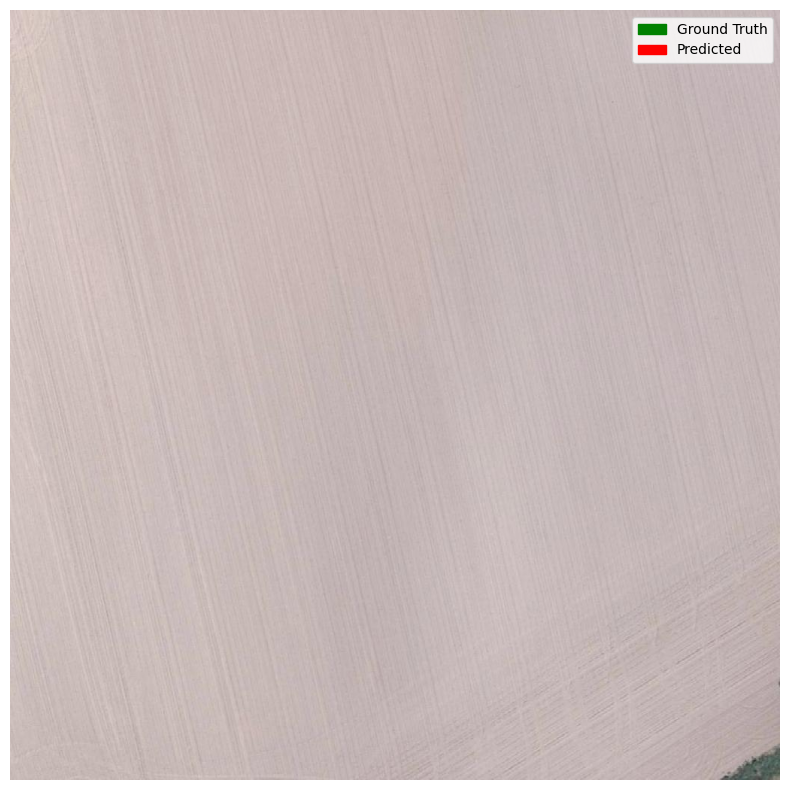

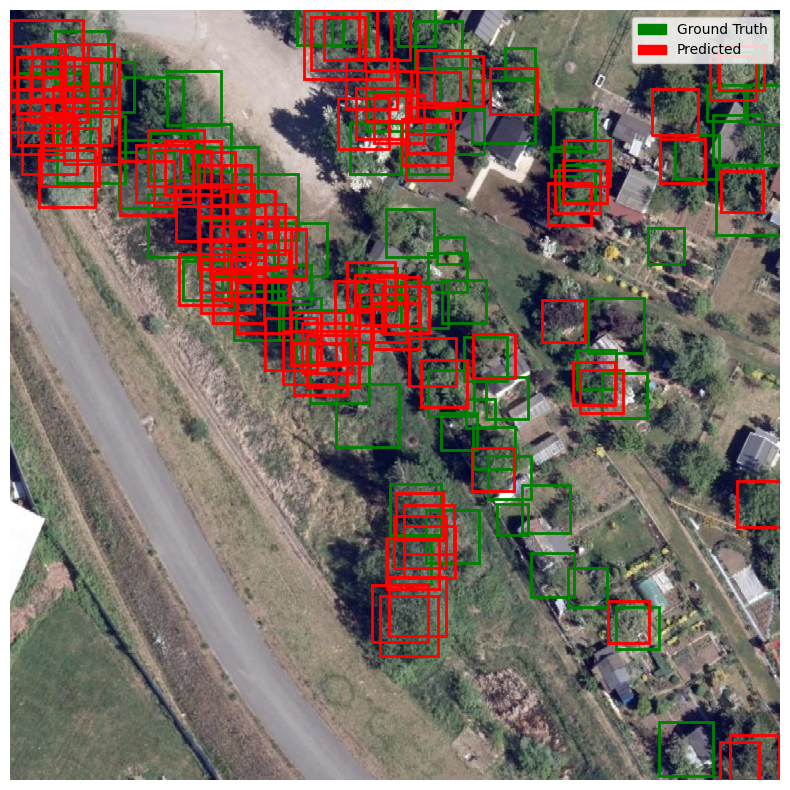

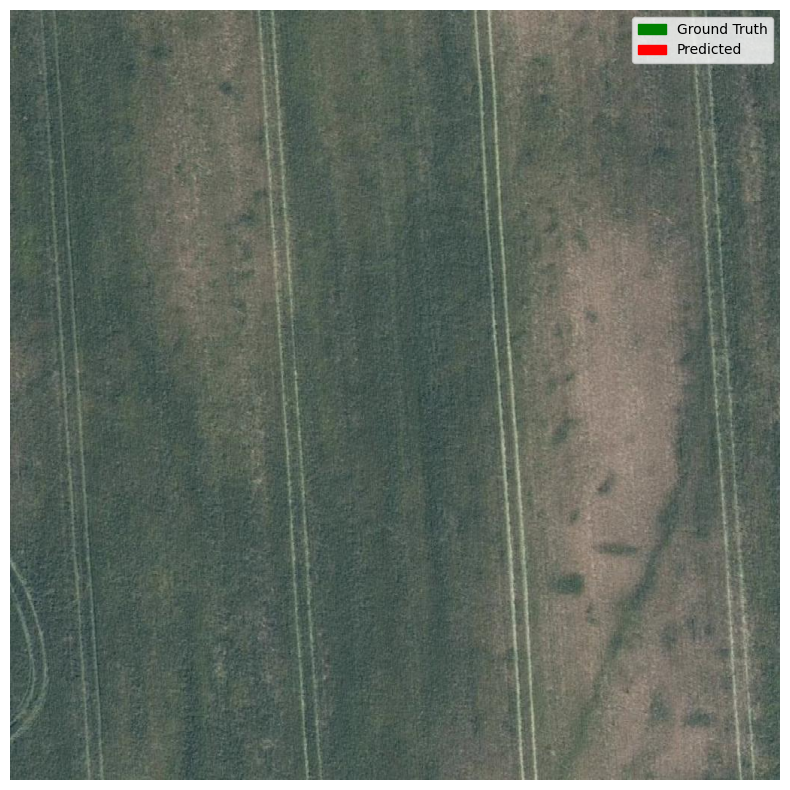

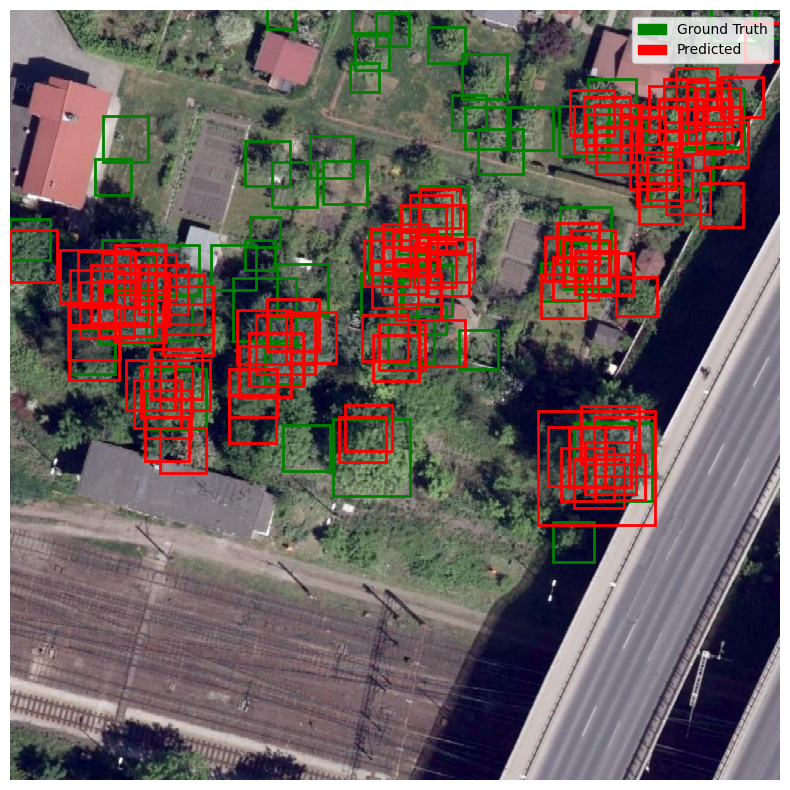

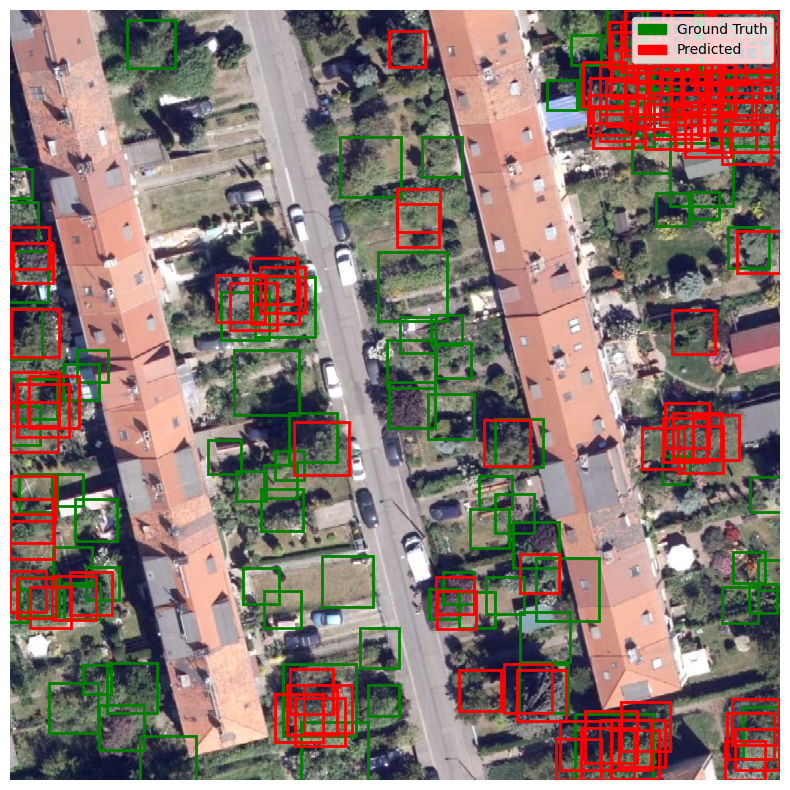

...

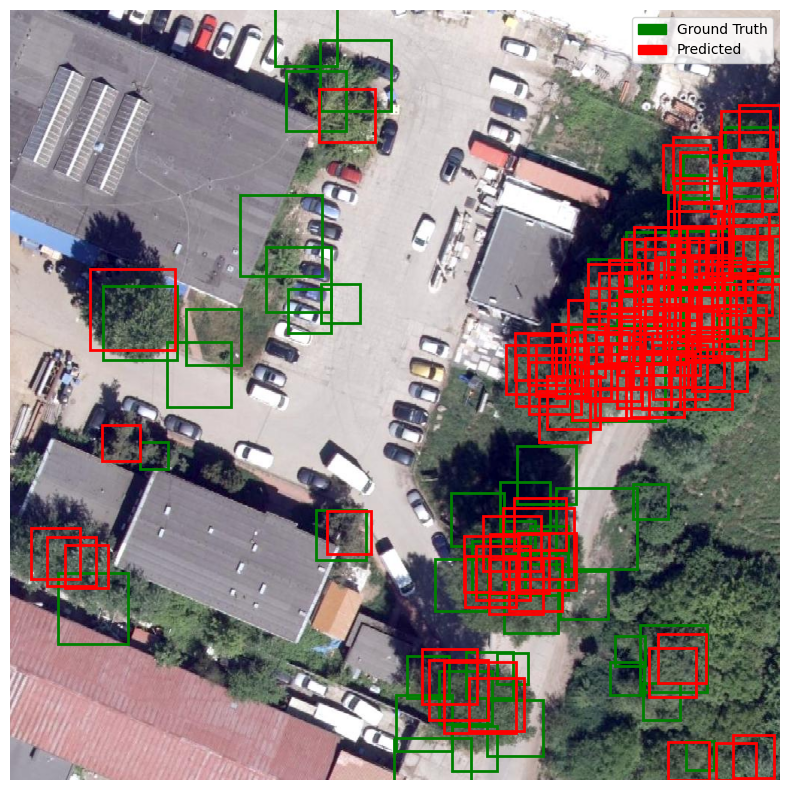

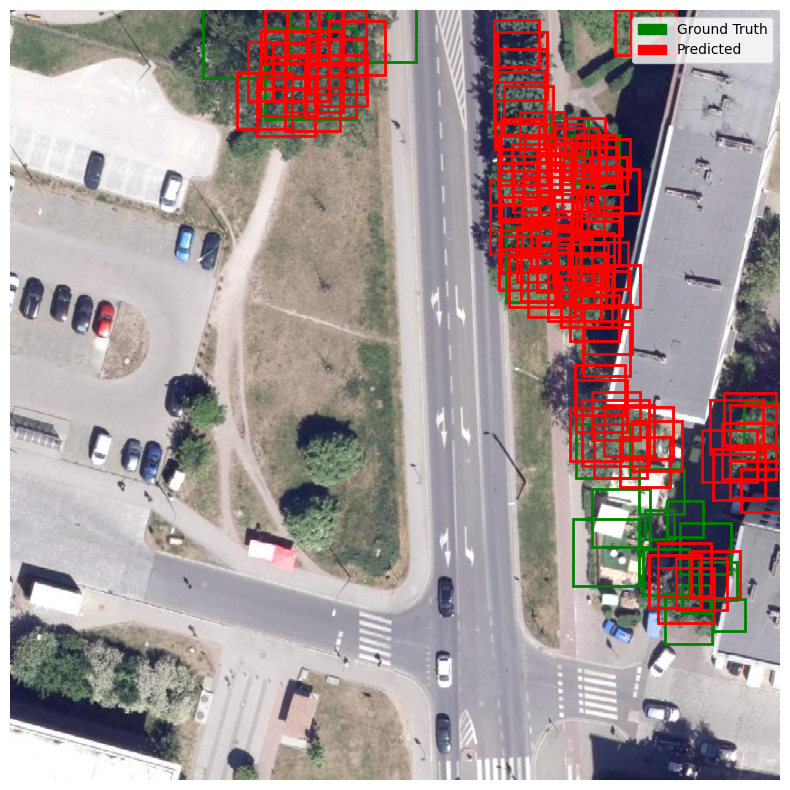

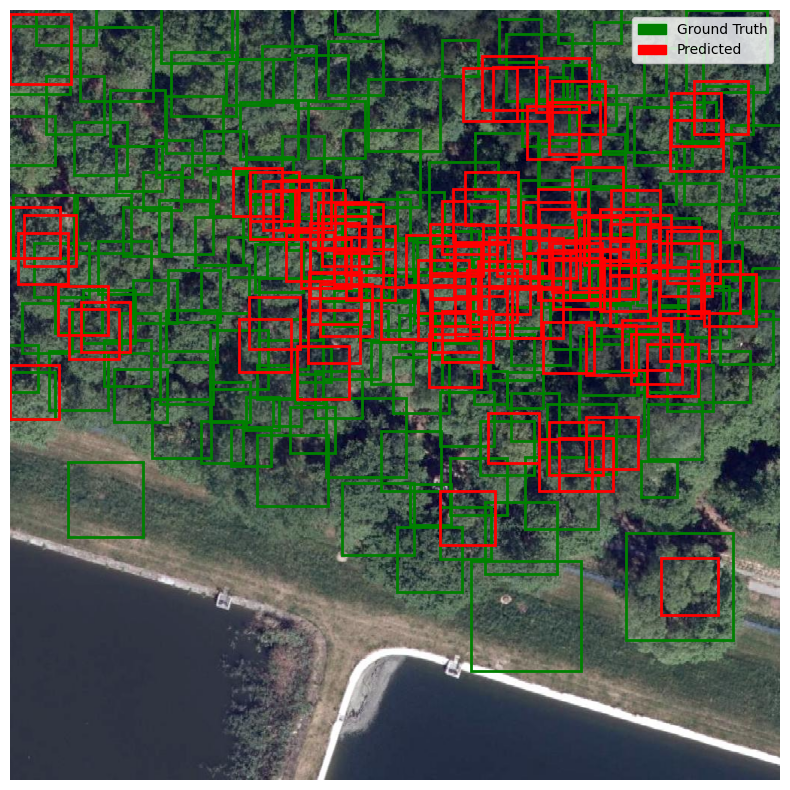

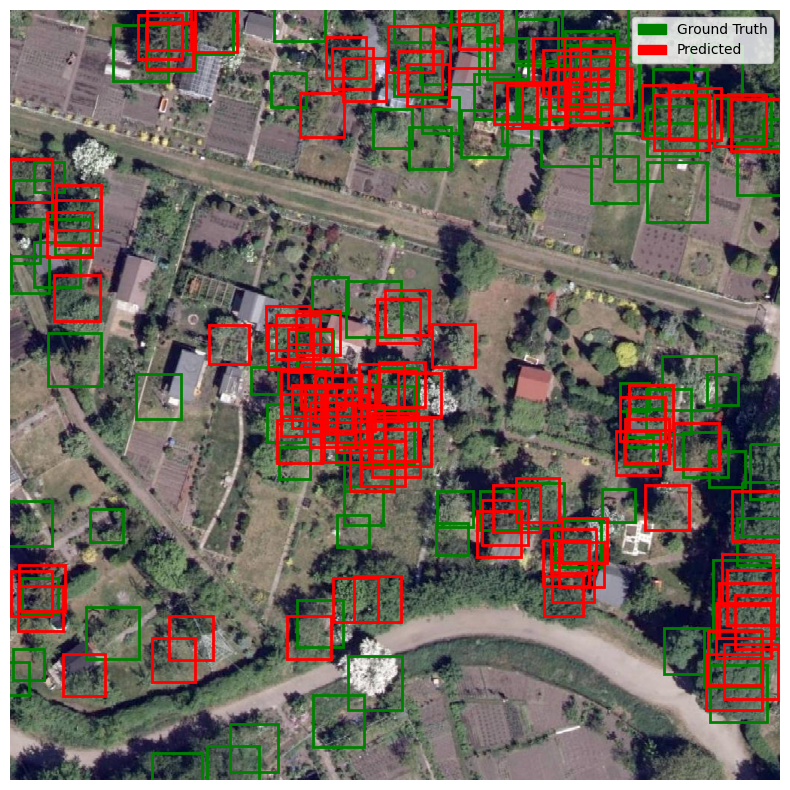

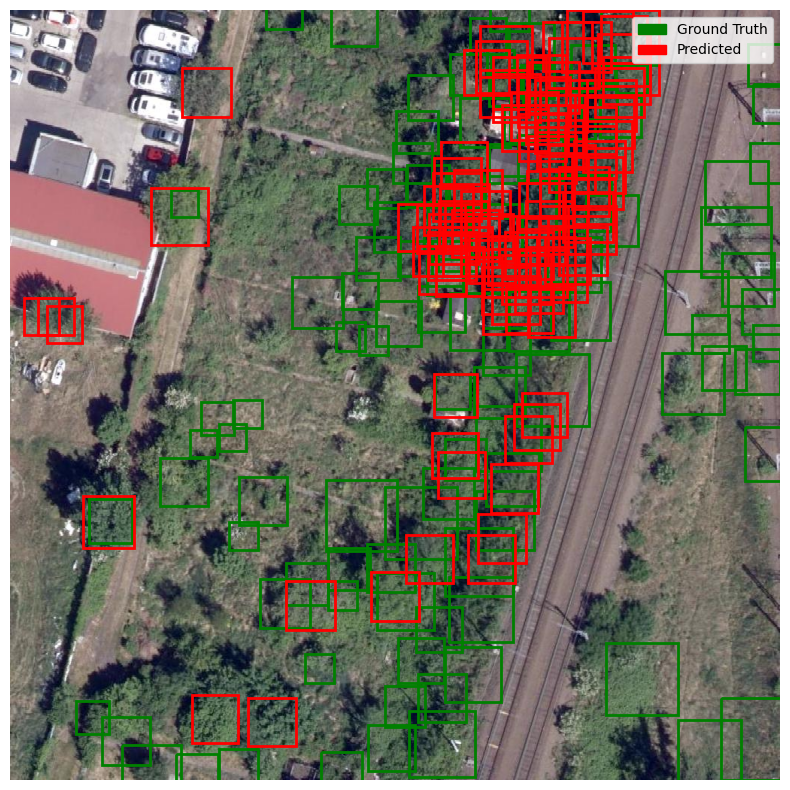

In [11]:
import matplotlib.pyplot as plt
import torchvision.transforms.functional as F
import matplotlib.patches as mpatches

# Set the model to evaluation mode
model.eval()

# Move model to CPU
model.to("cpu")

# Fetch a batch of images and targets from the validation dataloader
val_loader = data_module.val_dataloader()
images, targets = next(iter(val_loader))

# Move images to the appropriate device
images = [image.to("cpu") for image in images]

# Get predictions from the model
with torch.no_grad():
    predictions = model(images)


# Function to plot bounding boxes
def plot_boxes(image, boxes, color):
    for box in boxes:
        x_min, y_min, x_max, y_max = box.cpu().numpy()
        plt.gca().add_patch(
            plt.Rectangle(
                (x_min, y_min),
                x_max - x_min,
                y_max - y_min,
                fill=False,
                edgecolor=color,
                linewidth=2,
            )
        )


# Function to invert normalization
def invert_normalization(image, mean, std):
    mean = torch.tensor(mean).view(3, 1, 1)
    std = torch.tensor(std).view(3, 1, 1)
    image = image * std + mean
    return image


# Mean and std used in normalization
mean = [0.485, 0.456, 0.406]
std = [0.229, 0.224, 0.225]

# Plot the images with ground truth and predicted bounding boxes
for i, image in enumerate(images):
    plt.figure(figsize=(10, 10))
    image = invert_normalization(image, mean, std)
    plt.imshow(F.to_pil_image(image.cpu()))
    plt.axis("off")

    # Plot ground truth boxes in green
    plot_boxes(image, targets[i]["boxes"], "green")

    # Plot predicted boxes in red
    plot_boxes(image, predictions[i]["boxes"], "red")

    # add a legend to the plot

    # Create custom legend handles
    green_patch = mpatches.Patch(color="green", label="Ground Truth")
    red_patch = mpatches.Patch(color="red", label="Predicted")

    # Add legend to the plot
    plt.legend(handles=[green_patch, red_patch], loc="upper right")

    plt.show()

In [ ]:
import matplotlib.pyplot as plt
import pytorch_lightning as pl

# Initialize the Lightning Data Module
data_module = TreesLightningDataModule(
    data=ds,
    batch_size=1,  # Fetch a single example for visualization
    train_fraction=0.8,
    transform=T.Compose(
        [
            T.ToTensor(),
            T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
        ]
    ),
    num_workers=0,
)

# Prepare and set up the data
data_module.prepare_data()
data_module.setup()

# Get the training dataloader
train_loader = data_module.train_dataloader()

# Fetch the first batch
for images, targets in train_loader:
    image = images[0]  # Single image
    target = targets[0]  # Corresponding target
    break

# Reverse normalization for visualization
# mean = torch.tensor([0.485, 0.456, 0.406])
# std = torch.tensor([0.229, 0.224, 0.225])
# image = T.ToTensor()(image)  # Convert PIL image to tensor
# image = image.permute(1, 2, 0) * std + mean  # HWC format, reverse normalization
# image = image.numpy()

# Display the image and bounding boxes
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
# print image it and show id from results ds

print(target["image_id"])

# Plot bounding boxes
boxes = target["boxes"]
for box in boxes:
    x_min, y_min, x_max, y_max = box.numpy()
    plt.gca().add_patch(
        plt.Rectangle(
            (x_min, y_min),
            x_max - x_min,
            y_max - y_min,
            fill=False,
            edgecolor="red",
            linewidth=2,
        )
    )

plt.show()

# Print the target dictionary

In [ ]:
ds[target["image_id"].item()]["results"]